In [48]:
# from pymongo import MongoClient

# def validate_and_fix_bids():
#     """
#     Valida e corrige os documentos no banco de dados onde os bids estão fora de ordem.
#     """
#     # Configuração do MongoDB
#     client = MongoClient("mongodb://localhost:27017/")  # Substitua pela URI do seu banco de dados
#     db = client['trader_data']  # Nome do banco de dados
#     collection = db['order_book_snapshots_vidt_usdt']  # Nome da coleção

#     try:
#         # Buscar todos os documentos na coleção
#         documents = collection.find()

#         for doc in documents:
#             # Validar se "bids" está presente e é uma lista válida
#             if "bids" in doc and isinstance(doc["bids"], list) and len(doc["bids"]) > 1:
#                 first_bid = float(doc["bids"][0][0])  # Primeiro elemento do primeiro bid
#                 last_bid = float(doc["bids"][-1][0])  # Primeiro elemento do último bid

#                 # Verificar se os bids estão fora de ordem
#                 if first_bid < last_bid:
#                     print(f"Corrigindo documento com _id: {doc['_id']}, {doc['timestamp']}")
#                     # # Corrigir bids invertendo a ordem
#                     corrected_bids = doc["bids"][::-1]

#                     # # Atualizar o documento no banco de dados
#                     collection.update_one({"_id": doc["_id"]}, {"$set": {"bids": corrected_bids}})
#                     # break
#         print("Validação e correção concluídas!")

#     except Exception as e:
#         print(f"Erro ao validar e corrigir os documentos: {e}")

# # Executar o método
# validate_and_fix_bids()


Corrigindo documento com _id: 676c0b329a29c5b8eca142a6, 2024-12-25T13:40:02.261805
Corrigindo documento com _id: 676c0b349a29c5b8eca142a7, 2024-12-25T13:40:04.604793
Corrigindo documento com _id: 676c0b369a29c5b8eca142a8, 2024-12-25T13:40:06.948544
Corrigindo documento com _id: 676c0b399a29c5b8eca142a9, 2024-12-25T13:40:09.292366
Corrigindo documento com _id: 676c0b3b9a29c5b8eca142aa, 2024-12-25T13:40:11.633529
Corrigindo documento com _id: 676c0b3d9a29c5b8eca142ab, 2024-12-25T13:40:13.977540
Corrigindo documento com _id: 676c0b409a29c5b8eca142ac, 2024-12-25T13:40:16.320256
Corrigindo documento com _id: 676c0b429a29c5b8eca142ad, 2024-12-25T13:40:18.661190
Corrigindo documento com _id: 676c0b459a29c5b8eca142ae, 2024-12-25T13:40:21.004768
Corrigindo documento com _id: 676c0b479a29c5b8eca142af, 2024-12-25T13:40:23.346177
Corrigindo documento com _id: 676c0b499a29c5b8eca142b0, 2024-12-25T13:40:25.686998
Corrigindo documento com _id: 676c0b4c9a29c5b8eca142b1, 2024-12-25T13:40:28.024990
Corr

In [40]:
import json
from collections import defaultdict
from decimal import Decimal, ROUND_DOWN
import os


import numpy as np
import pandas as pd

import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')


In [41]:
# import json

# # Lista para armazenar o conteúdo concatenado
# concatenated_list = []

# # Lista de caminhos dos arquivos JSON
# file_paths = ["tt/futures_orderbook_history_1.json", "tt/futures_orderbook_history_2.json", "tt/futures_orderbook_history_3.json"]

# # Loop para abrir e adicionar o conteúdo dos arquivos
# for file_path in file_paths:
#     with open(file_path, 'r') as f:
#         data = json.load(f)  # Carrega o conteúdo do arquivo como lista
#         concatenated_list.extend(data)  # Adiciona os itens à lista final

# # Salvar o resultado em um novo arquivo, se necessário
# with open("futures_orderbook_history.json", 'w') as output_file:
#     json.dump(concatenated_list, output_file, indent=4)

# print("Arquivos concatenados com sucesso!")

In [42]:
from pymongo import MongoClient
import json

# Configuração do MongoDB
client = MongoClient("mongodb://localhost:27017/")  # Substitua pela URI do seu banco de dados
db = client['trader_data']  # Nome do banco de dados
collection = db['order_book_snapshots_vidt_usdt']  # Nome da coleção

# Caminho do arquivo JSON
file_path = "futures_orderbook_history.json"

# Carregar dados do arquivo JSON
with open(file_path, 'r') as file:
    data = json.load(file)  # Assume que o arquivo contém uma lista de snapshots

# Inserir cada elemento como um documento na coleção
if isinstance(data, list):
    collection.insert_many(data)  # Insere todos os elementos da lista
    print(f"{len(data)} snapshots inseridos com sucesso!")
else:
    print("O arquivo JSON não contém uma lista válida de dados.")


824 snapshots inseridos com sucesso!


In [36]:


def ensure_valid_gzip(filename):
    """
    Garante que o arquivo gzip seja válido. Se não existir, cria um arquivo inicial vazio compactado.
    """
    if not os.path.exists(filename):
        # Cria um arquivo gzip vazio contendo uma lista
        with gzip.open(filename, "wt") as f:
            json.dump([], f)


def load_existing_data(filename):
    """
    Carrega os dados existentes de um arquivo compactado gzip.
    """
    try:
        with gzip.open(filename, "rt") as f:
            return json.load(f)
    except (OSError, json.JSONDecodeError):
        print(f"Erro ao carregar o arquivo {filename}. Inicializando como lista vazia.")
        return []



def load_existing_data(filename):
    """
    Carrega os dados existentes de um arquivo compactado gzip.
    """
    try:
        with open(filename) as f:
            return json.load(f)
    except (OSError, json.JSONDecodeError):
        print(f"Erro ao carregar o arquivo {filename}. Inicializando como lista vazia.")
        return []


def group_orderbook_by_tick(orderbook_snapshots, tick_size):
    """
    Processa o JSON do orderbook e agrupa os preços por um tick size especificado.

    :param orderbook_snapshots: Lista de snapshots do orderbook.
    :param tick_size: Tamanho do tick (ex.: 0.01, 0.001, 0.0001).
    :return: Lista de snapshots agrupados pelo tick size.
    """
    tick_size = Decimal(str(tick_size))  # Garantir precisão com decimal
    grouped_snapshots = []

    for snapshot in orderbook_snapshots:
        grouped_snapshot = {
            "timestamp": snapshot["timestamp"],
            "bids": _group_prices(snapshot["bids"], tick_size),
            "asks": _group_prices(snapshot["asks"], tick_size)
        }
        grouped_snapshots.append(grouped_snapshot)
    
    return grouped_snapshots


def _group_prices(prices, tick_size):
    """
    Agrupa preços de bids ou asks por um tick size especificado.

    :param prices: Lista de preços e quantidades (ex.: [["0.0320400", "10245"], ...]).
    :param tick_size: Tamanho do tick (ex.: 0.01, 0.001, 0.0001).
    :return: Lista agrupada de preços e quantidades.
    """
    grouped = defaultdict(Decimal)

    for price, quantity in prices:
        # Arredonda o preço para o tick size
        rounded_price = (Decimal(price) // tick_size) * tick_size
        # Soma a quantidade no preço arredondado
        grouped[rounded_price] += Decimal(quantity)
    
    # Retorna o resultado como uma lista ordenada
    return [[str(price), str(quantity)] for price, quantity in sorted(grouped.items())]

In [37]:
filename = "futures_orderbook_history.json"

# Carrega os dados existentes
existing_data = load_existing_data(filename)


# Agrupar bids e asks com tick size de 0.01
tick_size = 0.00001
grouped = group_orderbook_by_tick(existing_data, tick_size)

# snapshots = grouped[3050:]
snapshots = grouped[1:]


# Atualizando o código para trabalhar com 100 níveis

# Função para normalizar o livro de ofertas (reverte os bids para que o menor preço esteja no ínicio).
def normalize_order_book(snapshot):
    snapshot["bids"] = snapshot["bids"][::-1]  # Inverte a lista de bids
    return snapshot

# Aplicar a função em todos os snapshots
snapshots = [normalize_order_book(snapshot) for snapshot in snapshots]

# # Criar o DataFrame (data) se ainda não existir
# data = pd.DataFrame(snapshots)

# data["mid_price"] = [(float(snapshot["asks"][0][0]) + float(snapshot["bids"][0][0])) / 2 for snapshot in snapshots]




In [38]:
snapshots[0]

{'timestamp': '2024-12-23T19:57:08.335678',
 'bids': [['0.03206', '18609'],
  ['0.03205', '44967'],
  ['0.03204', '40480'],
  ['0.03203', '75046'],
  ['0.03202', '120327'],
  ['0.03201', '96511'],
  ['0.03200', '212928'],
  ['0.03199', '105148'],
  ['0.03198', '186515'],
  ['0.03197', '90611'],
  ['0.03196', '148525'],
  ['0.03195', '222670'],
  ['0.03194', '140193'],
  ['0.03193', '128380'],
  ['0.03192', '97072'],
  ['0.03191', '36301'],
  ['0.03190', '92417'],
  ['0.03189', '46568'],
  ['0.03188', '84734'],
  ['0.03187', '43806'],
  ['0.03186', '160747'],
  ['0.03185', '265029'],
  ['0.03184', '99508'],
  ['0.03183', '45347'],
  ['0.03182', '84991'],
  ['0.03181', '156184'],
  ['0.03180', '125476'],
  ['0.03179', '145013'],
  ['0.03178', '152295'],
  ['0.03177', '122219'],
  ['0.03176', '63552'],
  ['0.03175', '167026'],
  ['0.03174', '82312'],
  ['0.03173', '135296'],
  ['0.03172', '134898'],
  ['0.03171', '204901'],
  ['0.03170', '89433'],
  ['0.03169', '15744'],
  ['0.03168', '10

In [31]:
# print("1")
# data.values[0][0], data.values[-1][0]

In [32]:
data.values[0][0], data.values[-1][0]

('2024-12-23T19:57:08.335678', '2024-12-25T12:56:31.126714')

In [4]:

# ------------------------
# 1. Spread
# ------------------------
# Diferença entre o menor preço de venda (ask) e o maior preço de compra (bid).
data["spread"] = [float(snapshot["asks"][0][0]) - float(snapshot["bids"][0][0]) for snapshot in snapshots]

# ------------------------
# 2. Volume Total de Bids e Asks
# ------------------------
# Soma dos volumes de bids e asks para os 100 níveis.
data["total_bids_volume"] = [sum(float(bid[1]) for bid in snapshot["bids"]) for snapshot in snapshots]
data["total_asks_volume"] = [sum(float(ask[1]) for ask in snapshot["asks"]) for snapshot in snapshots]

# ------------------------
# 3. Desequilíbrio de Volume
# ------------------------
# Proporção do volume de bids em relação ao total de bids e asks.
data["volume_imbalance"] = data["total_bids_volume"] / (data["total_bids_volume"] + data["total_asks_volume"])

# ------------------------
# 4. Preço Médio Ponderado (Weighted Average Price - WAP)
# ------------------------
# Preço médio ponderado pelo volume para bids e asks.
def calculate_wap(levels):
    return sum(float(price) * float(volume) for price, volume in levels) / sum(float(volume) for _, volume in levels)

data["wap_bids"] = [calculate_wap(snapshot["bids"]) for snapshot in snapshots]
data["wap_asks"] = [calculate_wap(snapshot["asks"]) for snapshot in snapshots]

# ------------------------
# 5. Concentração de Volume
# ------------------------
# Mede a porcentagem do volume total presente em diferentes blocos do livro de ofertas (ex.: top 10, top 50, top 100).
def concentration(levels, total_volume, start, end):
    block_volume = sum(float(volume) for _, volume in levels[start:end])
    return block_volume / total_volume

data["bids_concentration_top10"] = [concentration(snapshot["bids"], total, 0, 10) for snapshot, total in zip(snapshots, data["total_bids_volume"])]
data["bids_concentration_top50"] = [concentration(snapshot["bids"], total, 0, 50) for snapshot, total in zip(snapshots, data["total_bids_volume"])]
data["bids_concentration_top100"] = [concentration(snapshot["bids"], total, 0, 100) for snapshot, total in zip(snapshots, data["total_bids_volume"])]

data["asks_concentration_top10"] = [concentration(snapshot["asks"], total, 0, 10) for snapshot, total in zip(snapshots, data["total_asks_volume"])]
data["asks_concentration_top50"] = [concentration(snapshot["asks"], total, 0, 50) for snapshot, total in zip(snapshots, data["total_asks_volume"])]
data["asks_concentration_top100"] = [concentration(snapshot["asks"], total, 0, 100) for snapshot, total in zip(snapshots, data["total_asks_volume"])]


# ------------------------
# 6. Consumo de Ordens por Nível
# ------------------------
# Calcula o consumo de bids e asks em cada nível entre snapshots consecutivos.
def calculate_level_consumption(snapshot_prev, snapshot_curr):
    bids_consumed_levels = []
    asks_consumed_levels = []

    # Calcular consumo de bids por nível
    for prev, curr in zip(snapshot_prev["bids"], snapshot_curr["bids"]):
        prev_volume = float(prev[1])
        curr_volume = float(curr[1])
        bids_consumed_levels.append(max(0, prev_volume - curr_volume))  # Apenas consumo positivo

    # Calcular consumo de asks por nível
    for prev, curr in zip(snapshot_prev["asks"], snapshot_curr["asks"]):
        prev_volume = float(prev[1])
        curr_volume = float(curr[1])
        asks_consumed_levels.append(max(0, prev_volume - curr_volume))  # Apenas consumo positivo

    return bids_consumed_levels, asks_consumed_levels

# Aplicar o cálculo em todos os snapshots
bids_consumed_levels_all = []
asks_consumed_levels_all = []

for i in range(1, len(snapshots)):
    bids_levels, asks_levels = calculate_level_consumption(snapshots[i - 1], snapshots[i])
    bids_consumed_levels_all.append(bids_levels)
    asks_consumed_levels_all.append(asks_levels)

# Adicionar resultados ao DataFrame
for level in range(100):
    data[f"bids_consumed_level_{level+1}"] = [0] + [bids[level] for bids in bids_consumed_levels_all]
    data[f"asks_consumed_level_{level+1}"] = [0] + [asks[level] for asks in asks_consumed_levels_all]

# ------------------------
# 7. Consumo Acumulado por Nível
# ------------------------
# Acumula o consumo por nível ao longo do tempo.
for level in range(100):
    data[f"bids_consumed_cumulative_level_{level+1}"] = data[f"bids_consumed_level_{level+1}"].cumsum()
    data[f"asks_consumed_cumulative_level_{level+1}"] = data[f"asks_consumed_level_{level+1}"].cumsum()

# ------------------------
# 8. Consumo Médio
# ------------------------
# Consumo médio instantâneo e acumulado considerando todos os 100 níveis.
data["bids_consumed_mean"] = data[[f"bids_consumed_level_{level+1}" for level in range(100)]].mean(axis=1)
data["asks_consumed_mean"] = data[[f"asks_consumed_level_{level+1}" for level in range(100)]].mean(axis=1)

data["bids_consumed_cumulative_mean"] = data[[f"bids_consumed_cumulative_level_{level+1}" for level in range(100)]].mean(axis=1)
data["asks_consumed_cumulative_mean"] = data[[f"asks_consumed_cumulative_level_{level+1}" for level in range(100)]].mean(axis=1)




NameError: name 'snapshots' is not defined

In [ ]:
data.tail(1)

In [86]:
data.head(1)

,mid_price,spread,total_bids_volume,total_asks_volume,volume_imbalance,wap_bids,wap_asks,bids_concentration_top10,bids_concentration_top50,bids_concentration_top100,...,bids_consumed_cumulative_level_98,asks_consumed_cumulative_level_98,bids_consumed_cumulative_level_99,asks_consumed_cumulative_level_99,bids_consumed_cumulative_level_100,asks_consumed_cumulative_level_100,bids_consumed_mean,asks_consumed_mean,bids_consumed_cumulative_mean,asks_consumed_cumulative_mean
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0


In [87]:
data.tail(1)

,mid_price,spread,total_bids_volume,total_asks_volume,volume_imbalance,wap_bids,wap_asks,bids_concentration_top10,bids_concentration_top50,bids_concentration_top100,...,bids_consumed_cumulative_level_98,asks_consumed_cumulative_level_98,bids_consumed_cumulative_level_99,asks_consumed_cumulative_level_99,bids_consumed_cumulative_level_100,asks_consumed_cumulative_level_100,bids_consumed_mean,asks_consumed_mean,bids_consumed_cumulative_mean,asks_consumed_cumulative_mean
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0


In [6]:


# b) Consumo por Nível
# Meça como os volumes em cada nível (ex.: top 3 ou top 5) estão sendo consumidos ao longo do tempo.

def calculate_level_consumption(snapshot_prev, snapshot_curr):
    # Consumo por nível (diferença entre volumes consecutivos)
    bids_consumed = [
        float(prev[1]) - float(curr[1]) for prev, curr in zip(snapshot_prev["bids"], snapshot_curr["bids"])
    ]
    asks_consumed = [
        float(prev[1]) - float(curr[1]) for prev, curr in zip(snapshot_prev["asks"], snapshot_curr["asks"])
    ]
    return sum(bids_consumed), sum(asks_consumed)

# Aplicar nos snapshots consecutivos
bids_consumed_per_level = [0]
asks_consumed_per_level = [0]
for i in range(1, len(snapshots)):
    bids, asks = calculate_level_consumption(snapshots[i - 1], snapshots[i])
    bids_consumed_per_level.append(bids)
    asks_consumed_per_level.append(asks)

data["bids_consumed_levels"] = bids_consumed_per_level
data["asks_consumed_levels"] = asks_consumed_per_level


# c) Velocidade Média de Consumo por Nível
# Mede o consumo por segundo em cada nível do livro.


time_interval = 1  # Intervalo entre snapshots (em segundos)

data["bids_velocity"] = data["bids_consumed_levels"] / time_interval
data["asks_velocity"] = data["asks_consumed_levels"] / time_interval

# Suavizar a velocidade de consumo
window = 1000  # Número de snapshots para suavização
data["smoothed_bids_velocity"] = data["bids_velocity"].rolling(window=window).mean()
data["smoothed_asks_velocity"] = data["asks_velocity"].rolling(window=window).mean()

# Direção do mercado baseada no desequilíbrio e consumo
data["market_direction"] = (
    data["volume_imbalance"] - 0.5  # Neutraliza o desequilíbrio para indicar direção
    + (data["smoothed_bids_velocity"] - data["smoothed_asks_velocity"]) / 2  # Consumo relativo
)


data["smoothed_direction"] = data["market_direction"].rolling(window=20).mean()


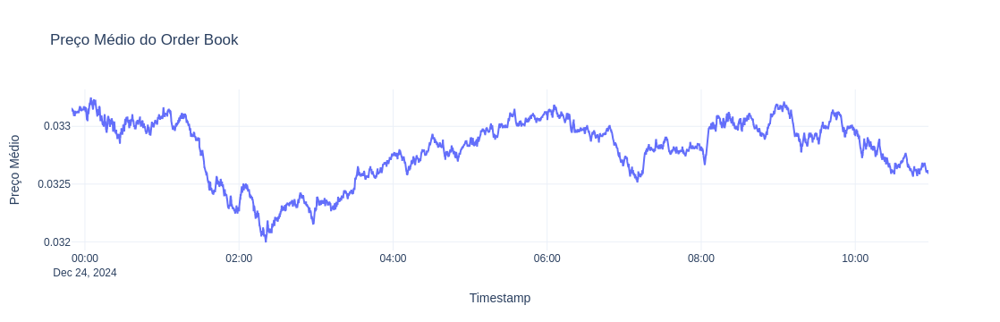

In [7]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['mid_price'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

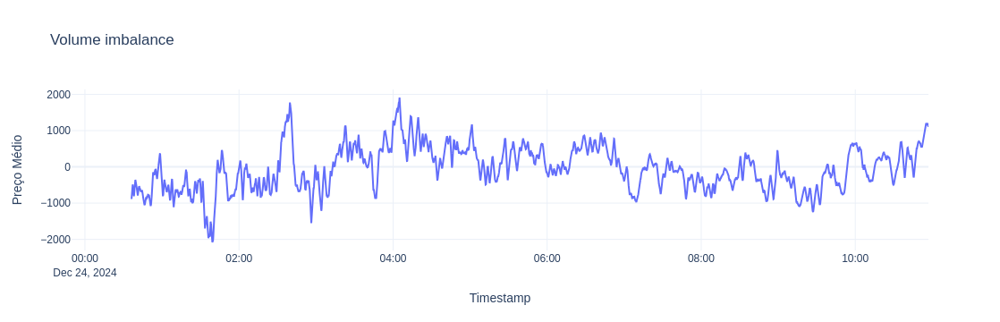

In [172]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['smoothed_direction'], mode="lines", name="Volume imbalance"))

# Configuração do layout
fig.update_layout(
    title="Volume imbalance",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

In [173]:
def calculate_level_consumption(snapshot_prev, snapshot_curr, start=0, end=None):
    if end is None:
        end = len(snapshot_prev["bids"])  # Considera todos os níveis por padrão
    # Consumo por nível (diferença entre volumes consecutivos)
    bids_consumed = [
        float(prev[1]) - float(curr[1]) for prev, curr in zip(snapshot_prev["bids"][start:end], snapshot_curr["bids"][start:end])
    ]
    asks_consumed = [
        float(prev[1]) - float(curr[1]) for prev, curr in zip(snapshot_prev["asks"][start:end], snapshot_curr["asks"][start:end])
    ]
    return sum(bids_consumed), sum(asks_consumed)

# Aplicar o cálculo em blocos específicos
block_definitions = [
    (0, 10, "top10"),
    (0, 50, "top50"),
    (0, 100, "top100")
]  # Definição para cobrir todos os 100 níveis
block_bids_consumed = {block_label: [] for _, _, block_label in block_definitions}
block_asks_consumed = {block_label: [] for _, _, block_label in block_definitions}

# Iterar sobre snapshots consecutivos
len_prev = 1
for i in range(len_prev, len(snapshots)):
    for start, end, block_label in block_definitions:
        bids, asks = calculate_level_consumption(snapshots[i - len_prev], snapshots[i], start, end)
        block_bids_consumed[block_label].append(bids)
        block_asks_consumed[block_label].append(asks)

# Adicionar resultados ao DataFrame
for _, _, block_label in block_definitions:
    data[f"bids_consumed_{block_label}"] = len_prev*[0] + block_bids_consumed[block_label]
    data[f"asks_consumed_{block_label}"] = len_prev*[0] + block_asks_consumed[block_label]

# ------------------------
# Velocidade e Suavização
# ------------------------
# Intervalo entre snapshots (em segundos)
time_interval = 1

# Velocidade de consumo para cada bloco
for _, _, block_label in block_definitions:
    data[f"bids_velocity_{block_label}"] = data[f"bids_consumed_{block_label}"] / time_interval
    data[f"asks_velocity_{block_label}"] = data[f"asks_consumed_{block_label}"] / time_interval

# Suavização da velocidade por bloco
velocity_window = 500  # Número de snapshots para suavização
for _, _, block_label in block_definitions:
    data[f"smoothed_bids_velocity_{block_label}"] = data[f"bids_velocity_{block_label}"].rolling(window=velocity_window).mean()
    data[f"smoothed_asks_velocity_{block_label}"] = data[f"asks_velocity_{block_label}"].rolling(window=velocity_window).mean()

# ------------------------
# Market Direction
# ------------------------
# Combinar desequilíbrio e velocidades suavizadas por bloco para um market direction granular.
market_direction_components = []

for _, _, block_label in block_definitions:
    component = (
        (data[f"smoothed_bids_velocity_{block_label}"] - data[f"smoothed_asks_velocity_{block_label}"]) / 1
    )
    market_direction_components.append(component)

# Combinar todos os blocos em um único indicador de direção
data["market_direction_block"] = data["volume_imbalance"] - 0.5 + sum(market_direction_components)/len(block_definitions)


# Suavizar o Market Direction
market_direction_window = 20
data["smoothed_market_direction"] = data["market_direction_block"].rolling(window=market_direction_window).mean()


weighted_direction = (
    1.8 * (data["smoothed_bids_velocity_top10"] - data["smoothed_asks_velocity_top10"]) +
    1.5 * (data["smoothed_bids_velocity_top50"] - data["smoothed_asks_velocity_top50"]) +
    1.1 * (data["smoothed_bids_velocity_top100"] - data["smoothed_asks_velocity_top100"])
)
data["weighted_market_direction"] = data["volume_imbalance"] - 0.5 + weighted_direction/len(block_definitions)
data["weighted_market_direction"] = data["weighted_market_direction"].rolling(window=market_direction_window).mean()


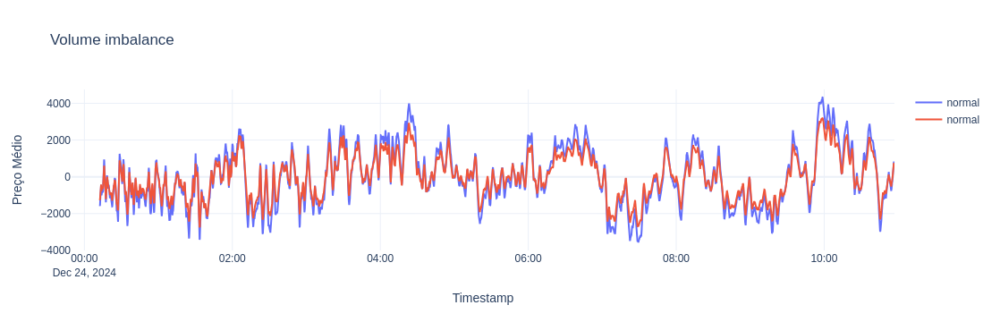

In [174]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['weighted_market_direction'], mode="lines", name="normal"))
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['smoothed_market_direction'], mode="lines", name="normal"))

# Configuração do layout
fig.update_layout(
    title="Volume imbalance",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

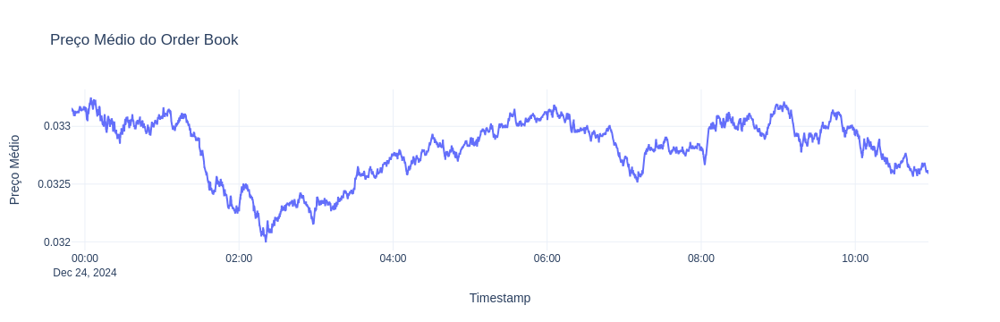

In [175]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['mid_price'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

In [176]:
import pandas as pd
import matplotlib.pyplot as plt

# Função para detectar suportes e resistências

def detect_support_resistance(snapshot, threshold_multiplier=2):
    """
    Detecta suportes e resistências com base no volume acumulado nos níveis de ask e bid.
    
    snapshot: O snapshot atual do livro de ofertas.
    threshold_multiplier: Multiplicador usado para determinar o quanto um nível precisa estar acima da média para ser um suporte ou resistência.
    
    Retorna:
    suportes, resistências: Listas de preços marcados como suportes (-1) ou resistências (1).
    """
    # Extrair os níveis de ask e bid
    asks = [(float(level[0]), float(level[1])) for level in snapshot["asks"]]
    bids = [(float(level[0]), float(level[1])) for level in snapshot["bids"]]

    # Calcular a média de volume para ask e bid
    avg_ask_volume = sum(volume for _, volume in asks) / len(asks)
    avg_bid_volume = sum(volume for _, volume in bids) / len(bids)

    # Determinar thresholds
    ask_threshold = avg_ask_volume * threshold_multiplier
    bid_threshold = avg_bid_volume * threshold_multiplier

    # Identificar resistências (ask acima do threshold)
    resistances = [price for price, volume in asks if volume > ask_threshold]

    # Identificar suportes (bid acima do threshold)
    supports = [price for price, volume in bids if volume > bid_threshold]

    return supports, resistances

# Adicionar os suportes e resistências ao DataFrame
support_resistance = []
threshold= 5
for snapshot in snapshots:
    supports, resistances = detect_support_resistance(snapshot, threshold)
    support_resistance.append((supports, resistances))

data["supports"] = [item[0] for item in support_resistance]
data["resistances"] = [item[1] for item in support_resistance]



# Função para gerar vetor de suporte e resistência

def mark_support_resistance(snapshot, supports, resistances):
    """
    Marca os níveis de suporte e resistência em um vetor com 1 para resistências e -1 para suportes.
    """
    levels = {price: 1 for price in resistances}  # Resistência marcada como 1
    levels.update({price: -1 for price in supports})  # Suporte marcado como -1
    
    return levels

support_resistance_vector = []



for snapshot, row in zip(snapshots, data.itertuples()):
    vector = mark_support_resistance(snapshot, row.supports, row.resistances)
    support_resistance_vector.append(vector)

# Adicionar vetor ao DataFrame
data["support_resistance_vector"] = support_resistance_vector



In [70]:
# ------------------------
# Plotar preço médio, suportes e resistências (otimizado)
# ------------------------

# plt.figure(figsize=(12, 6))

# # Preço médio
# plt.plot(data.index, data["mid_price"], label="Preço Médio", color="blue")

# # Armazenar suportes e resistências para plotagem em lote
# support_points_x = []
# support_points_y = []
# resistance_points_x = []
# resistance_points_y = []

# # Iterar sobre o DataFrame e coletar pontos
# for i, row in data.iterrows():
#     if row["supports"]:
#         support_points_x.extend([i] * len(row["supports"]))
#         support_points_y.extend(row["supports"])
#     if row["resistances"]:
#         resistance_points_x.extend([i] * len(row["resistances"]))
#         resistance_points_y.extend(row["resistances"])

# # Plotar suportes e resistências em lote
# plt.scatter(support_points_x, support_points_y, color="green", label="Suporte")
# plt.scatter(resistance_points_x, resistance_points_y, color="red", label="Resistência")

# # Configurações do gráfico
# plt.xlabel("Snapshot")
# plt.ylabel("Preço")
# plt.title("Preço Médio com Suportes e Resistências")
# plt.legend()
# plt.show()


In [189]:
# Função corrigida para consumo acumulado
def calculate_level_consumption(snapshot_prev, snapshot_curr, start=0, end=None):
    if end is None:
        end = len(snapshot_prev["bids"])  # Considera todos os níveis por padrão

    # Calcular consumo de bids
    bids_consumed = [
        max(0, float(prev[1]) - float(curr[1]))  # Consumo positivo apenas
        for prev, curr in zip(snapshot_prev["bids"][start:end], snapshot_curr["bids"][start:end])
    ]
    # Calcular consumo de asks
    asks_consumed = [
        max(0, float(prev[1]) - float(curr[1]))  # Consumo positivo apenas
        for prev, curr in zip(snapshot_prev["asks"][start:end], snapshot_curr["asks"][start:end])
    ]
    return sum(bids_consumed), sum(asks_consumed)

# Aplicar o cálculo em blocos específicos
block_definitions = [
    (0, 10, "top10"),
    (0, 50, "top50"),
    (0, 100, "top100")
]  # Definição para cobrir todos os 100 níveis
block_bids_consumed = {block_label: [] for _, _, block_label in block_definitions}
block_asks_consumed = {block_label: [] for _, _, block_label in block_definitions}

# Iterar sobre snapshots consecutivos
len_prev = 1
for i in range(len_prev, len(snapshots)):
    for start, end, block_label in block_definitions:
        bids, asks = calculate_level_consumption(snapshots[i - len_prev], snapshots[i], start, end)
        block_bids_consumed[block_label].append(bids)
        block_asks_consumed[block_label].append(asks)

# Adicionar resultados ao DataFrame
for _, _, block_label in block_definitions:
    data[f"bids_consumed_{block_label}"] = len_prev*[0] + block_bids_consumed[block_label]
    data[f"asks_consumed_{block_label}"] = len_prev*[0] + block_asks_consumed[block_label]


# Tamanho da janela deslizante (número de snapshots)
window_size = 50  # Ajuste conforme necessário

# Consumo acumulado em janela deslizante para bids
data["bids_consumed_cumulative_window"] = (
    data["bids_consumed_top10"].rolling(window=window_size).sum() +
    data["bids_consumed_top50"].rolling(window=window_size).sum() +
    data["bids_consumed_top100"].rolling(window=window_size).sum()
)

# Consumo acumulado em janela deslizante para asks
data["asks_consumed_cumulative_window"] = (
    data["asks_consumed_top10"].rolling(window=window_size).sum() +
    data["asks_consumed_top50"].rolling(window=window_size).sum() +
    data["asks_consumed_top100"].rolling(window=window_size).sum()
)


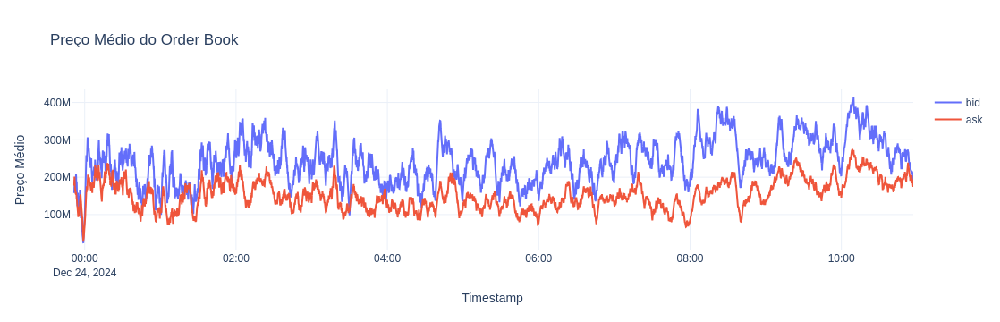

In [190]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['bids_consumed_cumulative_window'], mode="lines", name="bid"))
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['asks_consumed_cumulative_window'], mode="lines", name="ask"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

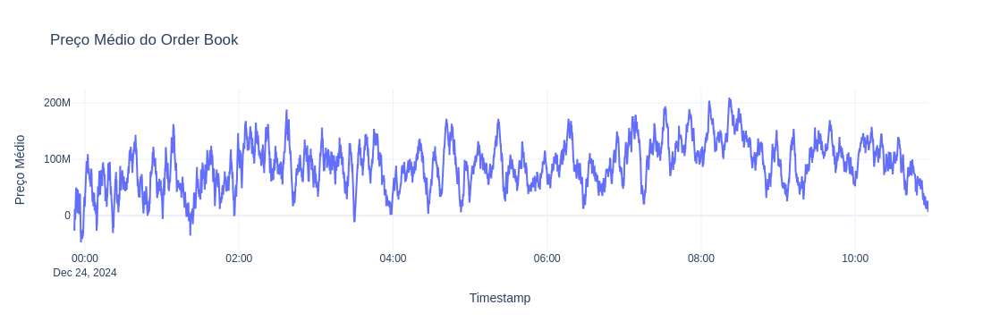

In [191]:
data["spread_consumed_cumulative_window"] = data["bids_consumed_cumulative_window"] - data["asks_consumed_cumulative_window"]
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['spread_consumed_cumulative_window'], mode="lines", name="bid"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

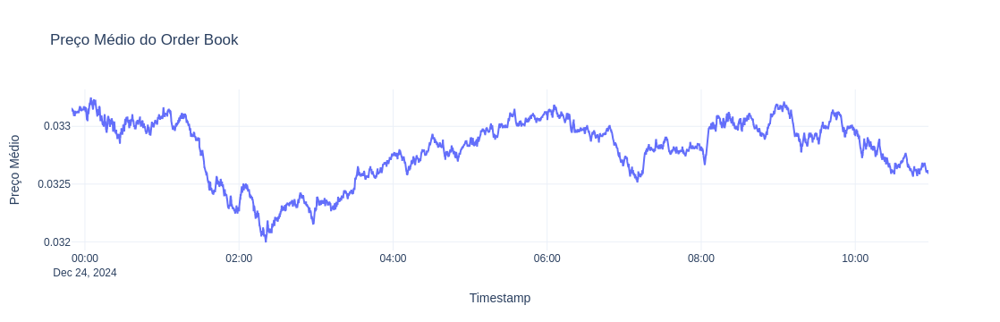

In [192]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['mid_price'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

In [193]:
# Normalização Min-Max
def min_max_normalize(series):
    return (series - series.min()) / (series.max() - series.min())

data["volume_imbalance_norm"] = min_max_normalize(data["volume_imbalance"])
data["bids_consumed_cumulative_window_norm"] = min_max_normalize(data["bids_consumed_cumulative_window"])
data["asks_consumed_cumulative_window_norm"] = min_max_normalize(data["asks_consumed_cumulative_window"])
data["spread_consumed_cumulative_window_norm"] = min_max_normalize(data["spread_consumed_cumulative_window"])



# Peso para os componentes
imbalance_weight = 0.5
cumulative_weight = 0.3
spread_weight = 0.2

# Calcular o novo market_direction
data["enhanced_market_direction"] = (
    (data["volume_imbalance_norm"] - 0.5) * imbalance_weight +  # Desequilíbrio de volume
    (data["bids_consumed_cumulative_window_norm"] - data["asks_consumed_cumulative_window_norm"]) * cumulative_weight +  # Consumo acumulado
    data["spread_consumed_cumulative_window_norm"] * spread_weight  # Spread acumulado
)

# Suavizar o novo market_direction
market_direction_window = 20
data["smoothed_enhanced_market_direction"] = data["enhanced_market_direction"].rolling(window=market_direction_window).mean()



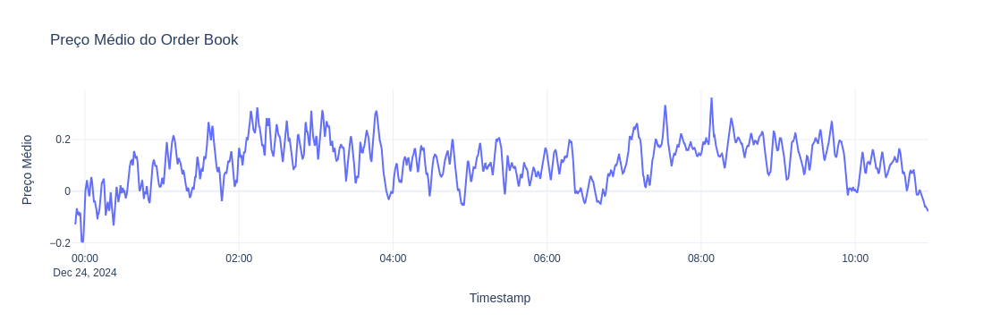

In [194]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['smoothed_enhanced_market_direction'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

In [48]:
# b) Consumo por Nível (Sequencial)
# Meça como os volumes em cada nível (ex.: top 3 ou top 5) estão sendo consumidos ao longo do tempo de forma sequencial.

def calculate_sequential_consumption(snapshot_prev, snapshot_curr):
    """
    Calcula o consumo válido sequencialmente em todos os níveis do livro de ofertas.
    O consumo em um nível só é considerado se o nível anterior tiver sido consumido.
    """
    bids_consumed = 0
    asks_consumed = 0

    # Verificar consumo sequencial para bids
    previous_bid_consumed = False  # Controle para verificar sequência
    for prev, curr in zip(snapshot_prev["bids"], snapshot_curr["bids"]):
        bid_diff = max(0, float(prev[1]) - float(curr[1]))
        if previous_bid_consumed or bid_diff > 0:  # Consumo é válido se anterior foi consumido
            bids_consumed += bid_diff
            previous_bid_consumed = True  # Marca que este nível foi consumido
        else:
            break  # Interrompe se o consumo não foi sequencial

    # Verificar consumo sequencial para asks
    previous_ask_consumed = False  # Controle para verificar sequência
    for prev, curr in zip(snapshot_prev["asks"], snapshot_curr["asks"]):
        ask_diff = max(0, float(prev[1]) - float(curr[1]))
        if previous_ask_consumed or ask_diff > 0:  # Consumo é válido se anterior foi consumido
            asks_consumed += ask_diff
            previous_ask_consumed = True  # Marca que este nível foi consumido
        else:
            break  # Interrompe se o consumo não foi sequencial

    return bids_consumed, asks_consumed

# Aplicar nos snapshots consecutivos
bids_consumed_per_level = [0]
asks_consumed_per_level = [0]
for i in range(1, len(snapshots)):
    bids, asks = calculate_sequential_consumption(snapshots[i - 1], snapshots[i])
    bids_consumed_per_level.append(bids)
    asks_consumed_per_level.append(asks)

data["bids_consumed_levels"] = bids_consumed_per_level
data["asks_consumed_levels"] = asks_consumed_per_level

# c) Velocidade Média de Consumo por Nível
# Mede o consumo por segundo em cada nível do livro.

time_interval = 1  # Intervalo entre snapshots (em segundos)

data["bids_velocity"] = data["bids_consumed_levels"] / time_interval
data["asks_velocity"] = data["asks_consumed_levels"] / time_interval

# Suavizar a velocidade de consumo
window = 100  # Número de snapshots para suavização
data["smoothed_bids_velocity"] = data["bids_velocity"].rolling(window=window).mean()
data["smoothed_asks_velocity"] = data["asks_velocity"].rolling(window=window).mean()

# data["market_direction"] = (
#     + (data["smoothed_bids_velocity"] - data["smoothed_asks_velocity"]) / 1  # Consumo relativo
# )
data["market_direction"] = (
    (data["smoothed_bids_velocity"] - data["smoothed_asks_velocity"]) /
    (data["smoothed_bids_velocity"] + data["smoothed_asks_velocity"] + 1e-9)  # Evita divisão por zero
)

data["smoothed_direction"] = data["market_direction"].rolling(window=10).mean()


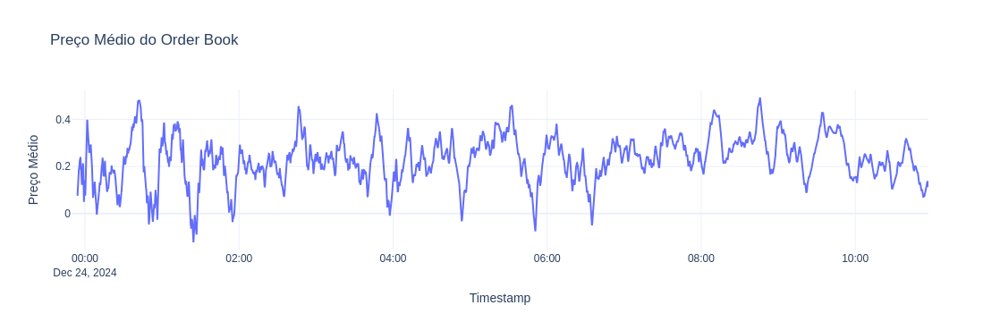

In [49]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['smoothed_direction'], mode="lines", name="Preço Médio"))
# fig.add_trace(go.Scatter(x=data['timestamp'], y=data['smoothed_asks_velocity'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

In [69]:

def calculate_level_consumption(snapshot_prev, snapshot_curr, start=0, end=None):
    if end is None:
        end = len(snapshot_prev["bids"])  # Considera todos os níveis por padrão
    # Consumo por nível (diferença entre volumes consecutivos)
    bids_consumed = [
        float(prev[1]) - float(curr[1]) for prev, curr in zip(snapshot_prev["bids"][start:end], snapshot_curr["bids"][start:end])
    ]
    asks_consumed = [
        float(prev[1]) - float(curr[1]) for prev, curr in zip(snapshot_prev["asks"][start:end], snapshot_curr["asks"][start:end])
    ]
    return sum(bids_consumed), sum(asks_consumed)


# Aplicar o cálculo em blocos específicos
block_definitions = [
    (0, 10, "top10"),
    (0, 50, "top50"),
    (0, 100, "top100")
]  # Definição para cobrir todos os 100 níveis
block_bids_consumed = {block_label: [] for _, _, block_label in block_definitions}
block_asks_consumed = {block_label: [] for _, _, block_label in block_definitions}

# Iterar sobre snapshots consecutivos
len_prev = 1
for i in range(len_prev, len(snapshots)):
    for start, end, block_label in block_definitions:
        bids, asks = calculate_level_consumption(snapshots[i - len_prev], snapshots[i], start, end)
        block_bids_consumed[block_label].append(bids)
        block_asks_consumed[block_label].append(asks)

# Adicionar resultados ao DataFrame
for _, _, block_label in block_definitions:
    data[f"bids_consumed_{block_label}"] = len_prev*[0] + block_bids_consumed[block_label]
    data[f"asks_consumed_{block_label}"] = len_prev*[0] + block_asks_consumed[block_label]


# Tamanho da janela deslizante (número de snapshots)
window_size = 10  # Ajuste conforme necessário

# Consumo acumulado em janela deslizante para bids
data["bids_consumed_cumulative_window"] = (
    data["bids_consumed_top10"].rolling(window=window_size).sum() +
    data["bids_consumed_top50"].rolling(window=window_size).sum() +
    data["bids_consumed_top100"].rolling(window=window_size).sum()
)

# Consumo acumulado em janela deslizante para asks
data["asks_consumed_cumulative_window"] = (
    data["asks_consumed_top10"].rolling(window=window_size).sum() +
    data["asks_consumed_top50"].rolling(window=window_size).sum() +
    data["asks_consumed_top100"].rolling(window=window_size).sum()
)

time_interval = 1  # Intervalo entre snapshots (em segundos)

data["bids_velocity"] = data["bids_consumed_cumulative_window"] / time_interval
data["asks_velocity"] = data["asks_consumed_cumulative_window"] / time_interval

# Suavizar a velocidade de consumo



window = 1000 # Número de snapshots para suavização
data["smoothed_bids_velocity"] = data["bids_velocity"].rolling(window=window).mean()
data["smoothed_asks_velocity"] = data["asks_velocity"].rolling(window=window).mean()

# Direção do mercado baseada no desequilíbrio e consumo
data["market_direction"] = (
    + (data["smoothed_bids_velocity"] - data["smoothed_asks_velocity"]) / 1  # Consumo relativo
)
# data["market_direction"] = (
#     (data["smoothed_bids_velocity"] - data["smoothed_asks_velocity"]) /
#     (data["smoothed_bids_velocity"] + data["smoothed_asks_velocity"] + 1e-9)  # Evita divisão por zero
# )

data["smoothed_direction"] = data["market_direction"].rolling(window=50).mean()


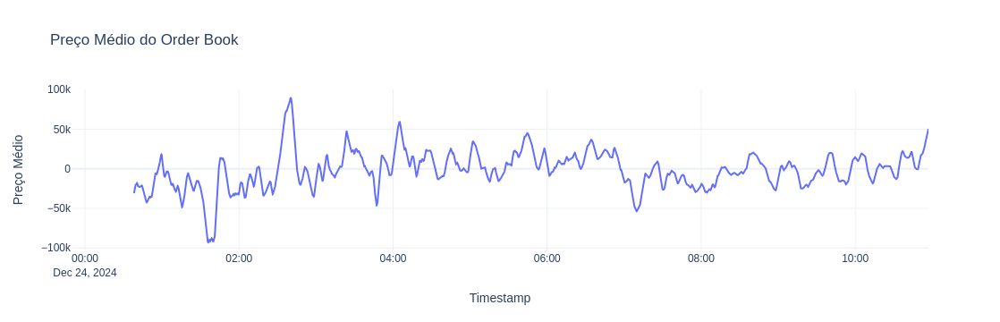

In [70]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['smoothed_direction'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

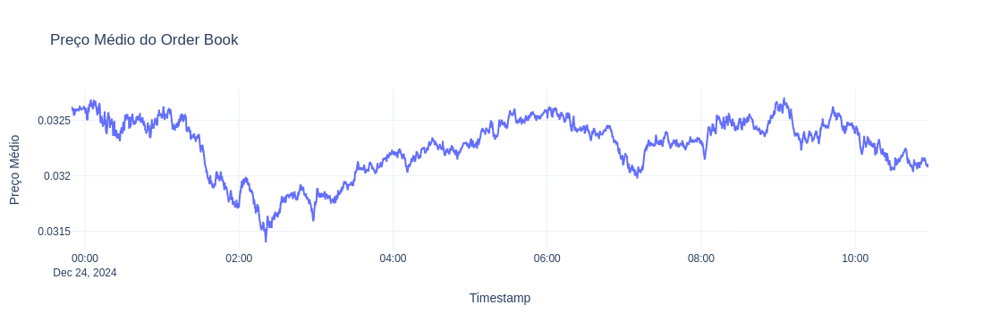

In [71]:
# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['mid_price'], mode="lines", name="Preço Médio"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()

In [72]:
list(data.columns)

['timestamp',
 'bids',
 'asks',
 'mid_price',
 'spread',
 'total_bids_volume',
 'total_asks_volume',
 'volume_imbalance',
 'wap_bids',
 'wap_asks',
 'bids_concentration_top10',
 'bids_concentration_top50',
 'bids_concentration_top100',
 'asks_concentration_top10',
 'asks_concentration_top50',
 'asks_concentration_top100',
 'bids_consumed_level_1',
 'asks_consumed_level_1',
 'bids_consumed_level_2',
 'asks_consumed_level_2',
 'bids_consumed_level_3',
 'asks_consumed_level_3',
 'bids_consumed_level_4',
 'asks_consumed_level_4',
 'bids_consumed_level_5',
 'asks_consumed_level_5',
 'bids_consumed_level_6',
 'asks_consumed_level_6',
 'bids_consumed_level_7',
 'asks_consumed_level_7',
 'bids_consumed_level_8',
 'asks_consumed_level_8',
 'bids_consumed_level_9',
 'asks_consumed_level_9',
 'bids_consumed_level_10',
 'asks_consumed_level_10',
 'bids_consumed_level_11',
 'asks_consumed_level_11',
 'bids_consumed_level_12',
 'asks_consumed_level_12',
 'bids_consumed_level_13',
 'asks_consumed_lev

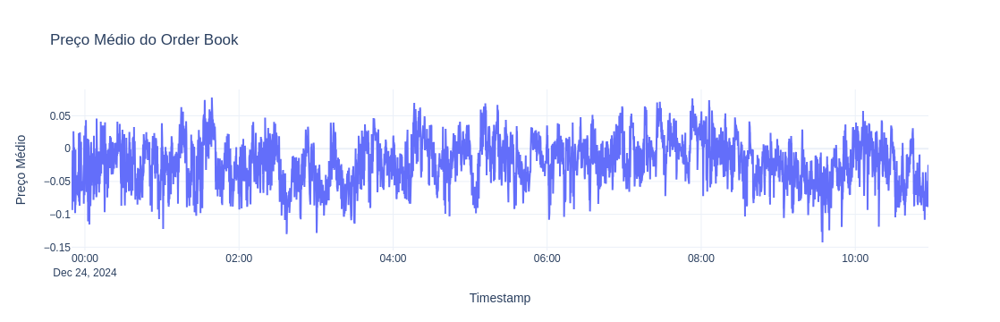

In [67]:
data["spread_concentration"] = data['bids_concentration_top10'] - data['asks_concentration_top10']

# Criação do gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['timestamp'], y=data['spread_concentration'], mode="lines", name="bid"))
# fig.add_trace(go.Scatter(x=data['timestamp'], y=data['asks_concentration_top10'], mode="lines", name="ask"))

# Configuração do layout
fig.update_layout(
    title="Preço Médio do Order Book",
    xaxis_title="Timestamp",
    yaxis_title="Preço Médio",
    template="plotly_white",
)

# Exibição do gráfico
fig.show()